In [22]:
import requests
import pandas as pd
import sys, json
import json
import string
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

url="https://archive.org/advancedsearch.php?q=(mystery+OR+mysterious)+AND+illness+AND+China&output=json&rows=50000"

In [23]:
response = requests.get(url).json()

In [24]:
response

{'responseHeader': {'status': 0,
  'QTime': 308,
  'params': {'query': '( (title:mystery^100 OR salients:mystery^50 OR subject:mystery^25 OR description:mystery^15 OR collection:mystery^10 OR language:mystery^10 OR text:mystery^1) OR (title:mysterious^100 OR salients:mysterious^50 OR subject:mysterious^25 OR description:mysterious^15 OR collection:mysterious^10 OR language:mysterious^10 OR text:mysterious^1) ) AND (title:illness^100 OR salients:illness^50 OR subject:illness^25 OR description:illness^15 OR collection:illness^10 OR language:illness^10 OR text:illness^1) AND (title:China^100 OR salients:China^50 OR subject:China^25 OR description:China^15 OR collection:China^10 OR language:China^10 OR text:China^1)',
   'qin': '(mystery OR mysterious) AND illness AND China',
   'fields': '_default_',
   'wt': 'json',
   'rows': '50000',
   'start': 0}},
 'response': {'numFound': 210,
  'start': 0,
  'docs': [{'backup_location': 'ia905306_21',
    'collection': ['inlibrary',
     'printdis

In [53]:
response['response']['docs'][1]['date']

'2020-03-21T00:00:00Z'

In [54]:
dates = [""]*9999
for count,row in enumerate(response['response']['docs']):
    try:
        dates[count]=row['publicdate']
    except:
        try:
            dates[count]=row['date']
        except:
            pass


In [55]:
dates

['2015-06-05T17:41:50Z',
 '2020-03-21T18:05:22Z',
 '2018-09-05T20:25:23Z',
 '2011-09-27T20:37:15Z',
 '2018-07-04T07:22:04Z',
 '2021-07-31T13:59:33Z',
 '2018-08-16T07:16:22Z',
 '2004-07-09T12:24:23Z',
 '2018-04-08T18:21:52Z',
 '2010-09-02T14:27:52Z',
 '2018-03-30T01:58:54Z',
 '2020-06-03T23:41:50Z',
 '2020-03-05T16:54:18Z',
 '2013-03-12T20:58:16Z',
 '2020-07-13T18:45:39Z',
 '2018-06-25T09:45:21Z',
 '2018-02-27T12:50:21Z',
 '2018-08-12T10:37:05Z',
 '2010-08-17T18:26:11Z',
 '2018-04-02T18:54:05Z',
 '2020-01-03T20:16:55Z',
 '2018-02-28T09:27:52Z',
 '2018-03-07T19:18:11Z',
 '2018-10-16T05:22:40Z',
 '2016-03-09T16:56:09Z',
 '2004-06-08T02:59:08Z',
 '2018-07-13T04:11:02Z',
 '2012-07-11T20:33:15Z',
 '2019-08-05T06:07:29Z',
 '2020-06-12T14:08:56Z',
 '2019-04-23T17:47:15Z',
 '2014-02-24T16:46:41Z',
 '2020-05-30T07:10:04Z',
 '2020-05-10T16:11:47Z',
 '2020-06-12T15:06:58Z',
 '2018-09-19T16:11:41Z',
 '2018-10-11T11:22:30Z',
 '2020-05-09T07:21:14Z',
 '2014-09-30T17:41:26Z',
 '2019-03-17T04:25:34Z',


In [56]:
dates = [x for x in dates if x]

In [57]:
dates = [x for x in dates if str(dates[0]) != "0"]

In [58]:
dates

['2015-06-05T17:41:50Z',
 '2020-03-21T18:05:22Z',
 '2018-09-05T20:25:23Z',
 '2011-09-27T20:37:15Z',
 '2018-07-04T07:22:04Z',
 '2021-07-31T13:59:33Z',
 '2018-08-16T07:16:22Z',
 '2004-07-09T12:24:23Z',
 '2018-04-08T18:21:52Z',
 '2010-09-02T14:27:52Z',
 '2018-03-30T01:58:54Z',
 '2020-06-03T23:41:50Z',
 '2020-03-05T16:54:18Z',
 '2013-03-12T20:58:16Z',
 '2020-07-13T18:45:39Z',
 '2018-06-25T09:45:21Z',
 '2018-02-27T12:50:21Z',
 '2018-08-12T10:37:05Z',
 '2010-08-17T18:26:11Z',
 '2018-04-02T18:54:05Z',
 '2020-01-03T20:16:55Z',
 '2018-02-28T09:27:52Z',
 '2018-03-07T19:18:11Z',
 '2018-10-16T05:22:40Z',
 '2016-03-09T16:56:09Z',
 '2004-06-08T02:59:08Z',
 '2018-07-13T04:11:02Z',
 '2012-07-11T20:33:15Z',
 '2019-08-05T06:07:29Z',
 '2020-06-12T14:08:56Z',
 '2019-04-23T17:47:15Z',
 '2014-02-24T16:46:41Z',
 '2020-05-30T07:10:04Z',
 '2020-05-10T16:11:47Z',
 '2020-06-12T15:06:58Z',
 '2018-09-19T16:11:41Z',
 '2018-10-11T11:22:30Z',
 '2020-05-09T07:21:14Z',
 '2014-09-30T17:41:26Z',
 '2019-03-17T04:25:34Z',


In [59]:
lastdates=len(dates)
newdates=0
while (newdates != lastdates):
    lastdates=newdates
    for i,row in enumerate(dates):    
        if dates[i][:4] < '2018':
            del dates[i]
            newdates=len(dates)

In [60]:
len(dates)

151

In [61]:
min(dates)

'2018-02-03T19:38:26Z'

In [62]:
max(dates)

'2021-10-01T14:25:32Z'

In [63]:
df = pd.DataFrame(dates)
#df = df.value_counts().sort_index()

In [64]:
df[0] = pd.to_datetime(df[0], dayfirst=True)

df1 = df[0].dt.date.value_counts().sort_index().reset_index()

df1.columns = ['DATE','Count']

In [65]:
df1['DATE'] = pd.to_datetime(df1['DATE'])

In [66]:
df1.set_index('DATE', inplace=True)

In [67]:
df1

,Count
DATE,
2018-02-03,1
2018-02-27,1
2018-02-28,1
2018-03-07,1
2018-03-12,1
...,...
2021-03-20,1
2021-04-23,1
2021-07-31,1


In [68]:
# drop the first row if nonsense
# df1.drop(df1.index[0],inplace=True)

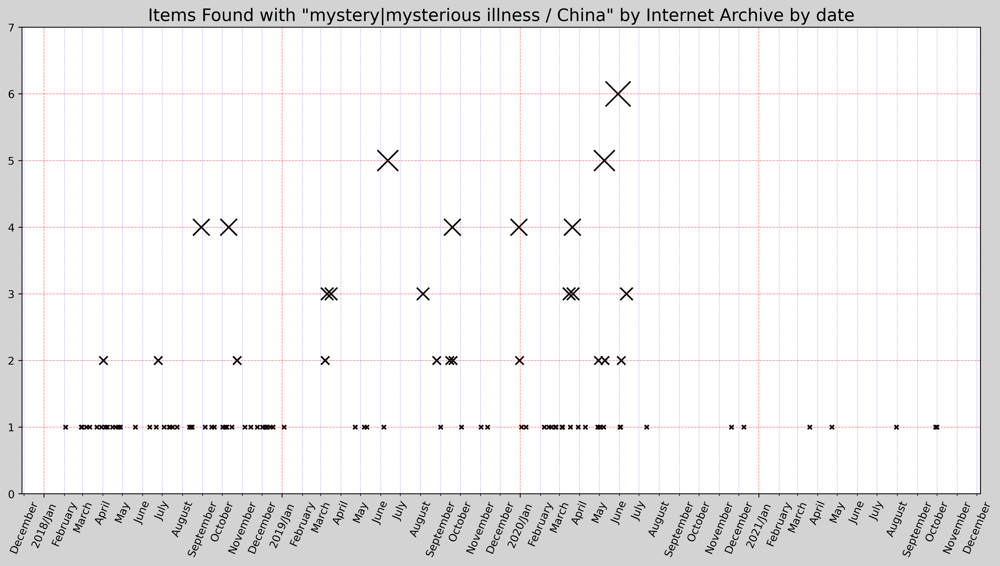

In [69]:
%matplotlib inline
x = df1.index
y = df1['Count']

fig= plt.figure(figsize=(16, 8), dpi=400,facecolor='lightgray')

plt.gca().xaxis.set_minor_formatter(mdates.DateFormatter('%B'))
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
plt.gca().tick_params(axis="x", which="both", rotation=67)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y/%b'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.scatter(x,y,s=y*y*15,marker='x',color='k')
plt.gca().grid(which='major', color='r', linestyle='-.', linewidth=.3, alpha=1)  
plt.gca().grid(which='minor', color='b', linestyle='-.', linewidth=.2,alpha=.7)
plt.ylim(top=7,bottom=0)
plt.title('Items Found with "mystery|mysterious illness / China" by Internet Archive by date',size=16)

plt.show()
plt.close()

In [ ]:

import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
from celluloid import Camera

fig = plt.figure(figsize=(16, 9), dpi=300,facecolor='lightgray')
ax=  fig.gca()
ax.xaxis.set_minor_formatter(mdates.DateFormatter('%B'))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.tick_params(axis="x", which="both", rotation=67)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y/%b'))
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.grid(which='major', color='r', linestyle='-.', linewidth=.3, alpha=1)  
ax.grid(which='minor', color='b', linestyle='-.', linewidth=.2,alpha=.7)
ax.set_ylim(top=100,bottom=0)

plt.title('Items Found with "Wuhan" by Internet Archive by date',size=16)

rows = []
a = 0
camera = Camera(fig)
for i,row in df1.iterrows():
    rows=df1[:i]
    ax.scatter(rows['Count'].index,rows['Count'],s=rows['Count']*4,marker='x',color='k')
    camera.snap()

anim = camera.animate(blit=False)

anim.save('scatter.gif',fps=60)

plt.show()
plt.close()